# TICA trajectory exploration plots

-----------

Assigning all workflow data to 'master' TICA model from long trajectory to assess ground-truth exploration of the protein conformation space

--------------------
Colormap for these plots, keeping the paint colors completely different than landscape colors

In [63]:
# Concatenating colormaps
cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
    'custom', 
    [(0,   'cyan'),
     (0.5, 'royalblue'),
     (1,   'violet')],
    N=126)

------------------


TICA space coordinates of frames
 - rows: workload
 - cols: replicate

Plotting for workflow: xma_Ca_3
 - on to workload #0
 - on to workload #1
 - on to workload #2
 - on to workload #3
 - on to workload #4
Plotting for workflow: umi_Ca_3
 - on to workload #0
 - on to workload #1
 - on to workload #2
 - on to workload #3
 - on to workload #4


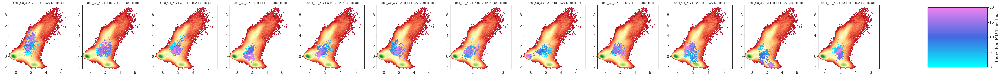

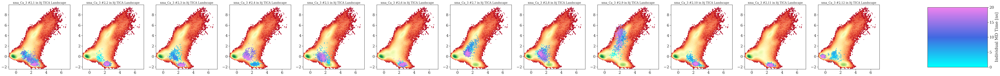

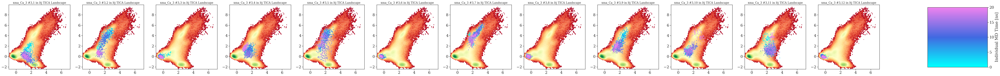

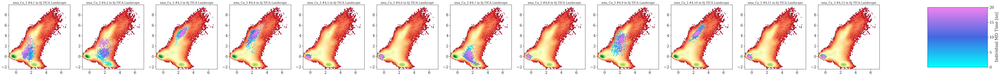

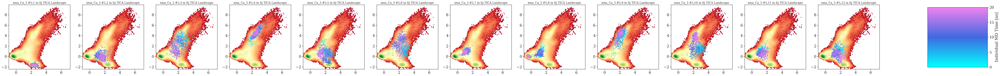

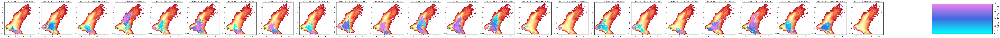

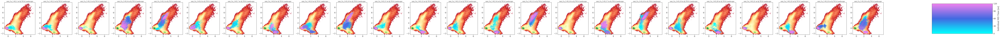

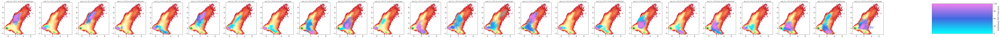

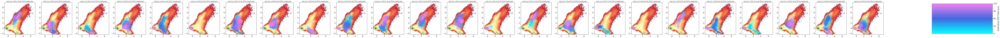

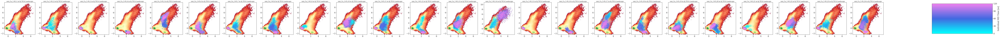

In [64]:
#w_actual = all_models[feat_Ca]["xma_Ca"]
#n_frames_workload = sum([ttj.shape[0] for ttj in w_actual["ttrajs"][:w_actual["n_trajs"]]])

#for feat,nm in [("invca","xma_Ca"), ("invca_ba","xma_Ca")]:
for feat,nm in [("invca","xma_Ca_3"),("invca","umi_Ca_3")]:

    w = all_models[feat][nm]
    ntj = w["n_trajs"]
    
    feature_data = w["data_reader"].get_output()
    
    master_tica  = dict(
   #     wkf = aswa_tools.get_matching_input(
    #        all_models[feat][nm]["tica"],
     #       key="lag", val=chosen_tica_lag),
        ltj = aswa_tools.get_matching_input(
  #  master_tica = aswa_tools.get_matching_input(
            all_models[feat]["ltj"]["tica"],
            key="lag", val=chosen_tica_lag),
    )

    workflow_in_master_tica = {
        k: v.transform(feature_data)
        for k,v in master_tica.items()
    }
    
    n_workloads = list({
        k : int(len(v)/ntj)
        for k,v in workflow_in_master_tica.items()
    }.values())[0]

    master_in_master_tica   = {
        k: np.concatenate(v.get_output([0,1]))
        for k,v in master_tica.items()
    }
    
    print(colorama.Back.BLUE + "Plotting for workflow: %s"%nm)
    
    for iw in range(n_workloads):

        I = len(workflow_in_master_tica)
        fig, ax = plt.subplots(
            I, ntj,
            figsize=(7*ntj, 6*I),
            squeeze=False)
    
        print(colorama.Back.CYAN + " - on to workload #%d"%iw)
        
        for i,(wnm,wimt) in enumerate(workflow_in_master_tica.items()):
            
            for j in range(ntj):
                workload_in_master_tica = [wimt[iw*ntj:(1+iw)*ntj][j]]
                
                workload_colors = cmap(
                    plt.Normalize()(
                        list(range(
                        workload_in_master_tica[0].shape[0]))
                    )
                )
            
                #pyemma.plots.plot_density(
                pyemma.plots.plot_free_energy(
                    *master_in_master_tica[wnm].T,
                    ax=ax[i][j],
                    alpha=0.8,
                    cbar=False,
                    cmap="RdYlGn_r",
                )
                for wlimt in workload_in_master_tica:
                    sc = ax[i][j].scatter(
                    #sc = ax[i][j].plot(
                        wlimt.T[0],#[::10],
                        wlimt.T[1],#[::10],
                        c=workload_colors,#[::10],
                        #linewidth=0,
                        s=6,
                    )
                sc.set_cmap(cmap)
                ax[i][j].set_title(
                    "%s #%d,%d in %s TICA Landscape"%(
                        nm,1+iw,1+j,wnm), fontsize=14)
        
        fig.subplots_adjust(right=0.85)
        cbar_ax = fig.add_axes([0.89, 0.15, 0.05, 0.7])
        cb = fig.colorbar(sc, cax=cbar_ax)
        cb.ax.set_ylabel("Individual MD Time [ns]")
        ticklocs = [r/4. for r in range(4)]+[1]
        cb.set_ticks(ticklocs)
        cb.set_ticklabels([
            int(r*workload_in_master_tica[0].shape[0]/step_per_ns[label_longtraj])
            for r in ticklocs])
        
        #fig.tight_layout() # doesn't know about extra add_axes call?
        plt.savefig("analyses/%s/wkl-%d-eachguy_on_tica_landscape.png"%(
            nm,iw), dpi=300)

--------------------
1 Workload on long traj landscape
 - rows: whole workload (many replicates stacked)
 - TODO make dots smaller and plot replicates in parallel while slicing the color list(to get all endpoints on top)

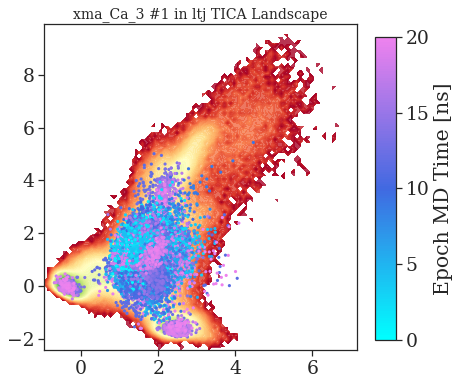

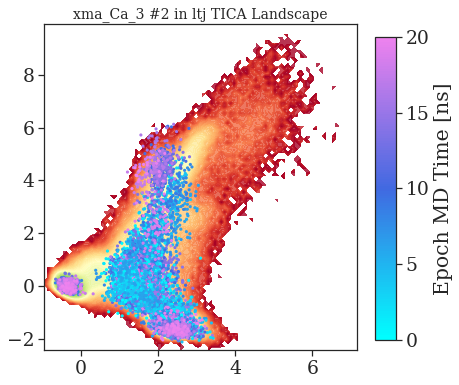

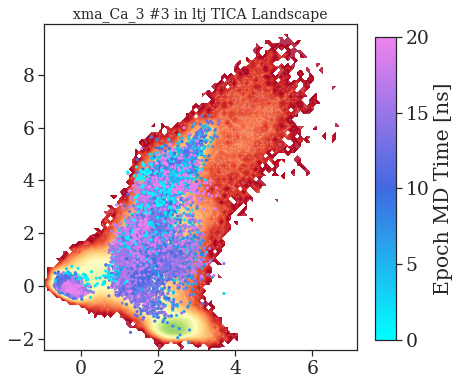

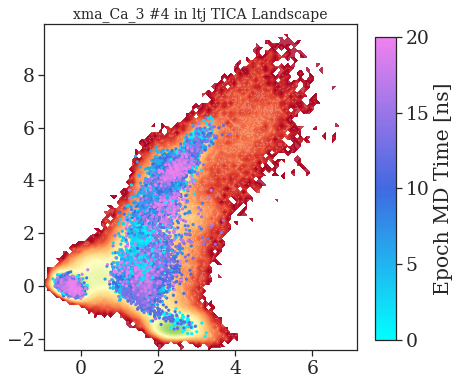

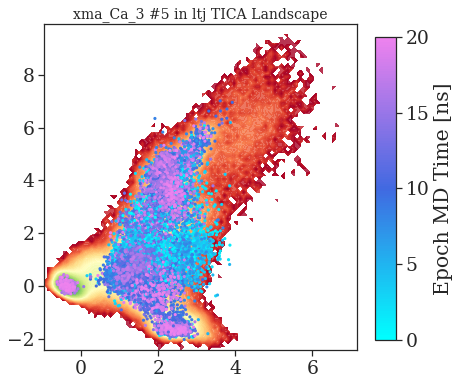

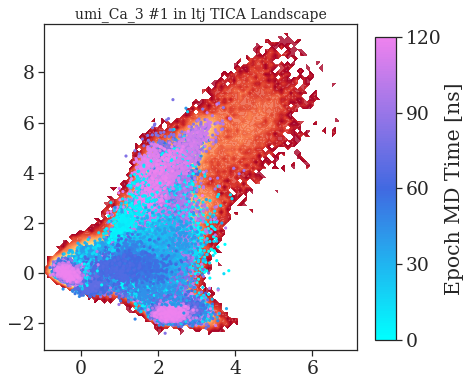

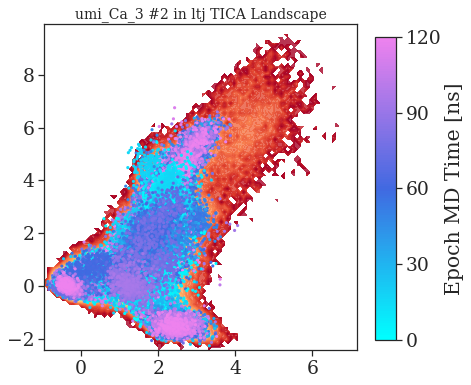

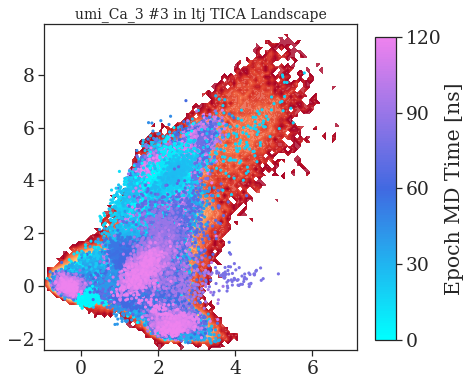

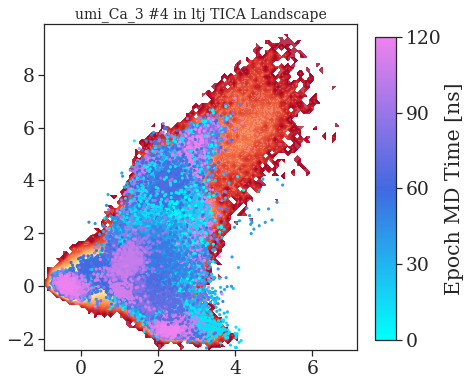

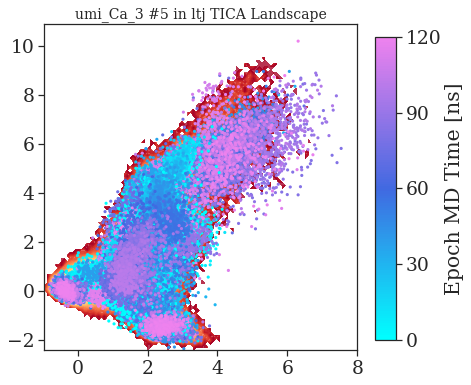

In [65]:
matplotlib
for feat,nm in [("invca","xma_Ca_3"), ("invca","umi_Ca_3")]:
    
    w = all_models[feat][nm]
    ntj = w["n_trajs"]
    
    feature_data = w["data_reader"].get_output()
    
    master_tica  = dict(
   #     wkf = aswa_tools.get_matching_input(
    #        all_models[feat][nm]["tica"],
     #       key="lag", val=chosen_tica_lag),
        ltj = aswa_tools.get_matching_input(
  #  master_tica = aswa_tools.get_matching_input(
            all_models[feat]["ltj"]["tica"],
            key="lag", val=chosen_tica_lag),
    )

    workflow_in_master_tica = {
        k: v.transform(feature_data)
        for k,v in master_tica.items()
    }
    
    n_workloads = list({
        k : int(len(v)/ntj)
        for k,v in workflow_in_master_tica.items()
    }.values())[0]

    master_in_master_tica   = {
        k: np.concatenate(v.get_output([0,1]))
        for k,v in master_tica.items()
    }
    
    for iw in range(n_workloads):

        I = len(workflow_in_master_tica)
        fig, ax = plt.subplots(1, I, figsize=(6*I, 6), squeeze=False)
    
        for i,(wnm,wimt) in enumerate(workflow_in_master_tica.items()):
            
            workload_in_master_tica = wimt[iw*ntj:(1+iw)*ntj]
            
            workload_colors = cmap(
                plt.Normalize()(list(range(
                    workload_in_master_tica[0].shape[0]))))
            
            #pyemma.plots.plot_density(
            pyemma.plots.plot_free_energy(
                *master_in_master_tica[wnm].T,
                ax=ax[i][0],
                alpha=0.8,
                cbar=False,
                cmap='RdYlGn_r',
            )
            for wlimt in workload_in_master_tica:
                sc = ax[i][0].scatter(
                    x=wlimt.T[0],#[::10],
                    y=wlimt.T[1],#[::10],
                    c=workload_colors,#[::10],
                    linewidth=0,
                    s=10,
                )
            sc.set_cmap(cmap)
            ax[i][0].set_title(
                "%s #%d in %s TICA Landscape"%(
                    nm,1+iw,wnm), fontsize=14)
        
        fig.subplots_adjust(right=0.85)
        cbar_ax = fig.add_axes([0.89, 0.15, 0.05, 0.7])
        cb = fig.colorbar(sc, cax=cbar_ax)
        cb.ax.set_ylabel("Epoch MD Time [ns]")
        ticklocs = [r/4. for r in range(4)]+[1]
        cb.set_ticks(ticklocs)
        cb.set_ticklabels([
            int(r*workload_in_master_tica[0].shape[0]/step_per_ns[label_longtraj])
            for r in ticklocs])
        
        #fig.tight_layout() # doesn't know about extra add_axes call?
        plt.savefig("analyses/%s/wkl-%d-chunk_on_tica_landscape.png"%(nm,iw), dpi=900)

-----------

-----------

-----------

-----------

-----------

-----------

-----------

-----------

-----------

-----------

-----------

-----------